In [1]:
import networkx as nx
import os
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
G = nx.read_gml("./graphs/2005-06-30")

In [3]:
#create list of all graphs
g_list = []
dates = []
for root, dirs, files in os.walk('./graphs'):
    for name in files:
        g_list.append(nx.read_gml(f'{root}/{name}'))
        dates.append(name)

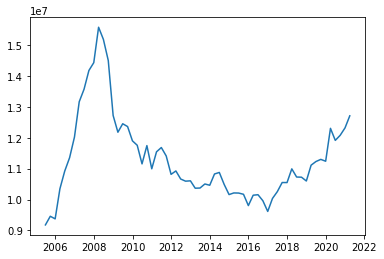

In [39]:
#total value
total_value = lambda G : G.size(weight = 'value')
tv_list = list(map(total_value, g_list))

tv_df = pd.DataFrame(tv_list)
tv_df.index = pd.to_datetime(dates)

plt.plot(tv_df)

In [5]:
#centrality for one network
eigenvector_dict = nx.eigenvector_centrality(G, weight = 'value')

from operator import itemgetter
sorted_eigenvector = sorted(eigenvector_dict.items(), key=itemgetter(1), reverse=True)
for b in sorted_eigenvector:
    print(b)

('US', 0.5907476595707514)
('GB', 0.4732859303983137)
('DE', 0.3718456866631047)
('CH', 0.3343509423610867)
('FR', 0.23149457547019928)
('JP', 0.21662403225099788)
('NL', 0.21187136416099703)
('ES', 0.11348612443987588)
('BE', 0.08131524877099461)
('IT', 0.06644671525359798)
('IE', 0.05454178003660056)
('CA', 0.036815910460313225)
('KR', 0.0326100131535245)
('SE', 0.025882603818873952)
('AU', 0.02364902152412013)
('AT', 0.020888244522474935)
('PT', 0.012014693222297085)
('TW', 0.011889955827927746)
('GR', 0.011768129927978025)
('IN', 0.00976690460598354)
('FI', 0.007482653898140848)
('TR', 0.003385788131480754)
('CL', 0.00022261503546721666)


In [6]:
#centrality for all networks
eig = lambda G: nx.eigenvector_centrality(G, weight = 'value')
eig_dict_list = list(map(eig, g_list))

df_eig = pd.DataFrame.from_dict(eig_dict_list)
df_eig.index = pd.to_datetime(dates)

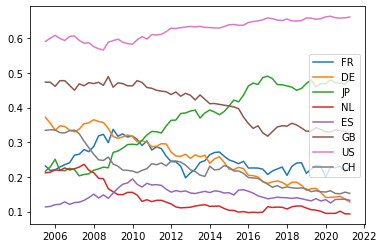

In [7]:
#Plot the most important nodes of the network over time
cond = df_eig.iloc[0]>0.1
df_eigI = df_eig[cond.index[cond]]
plt.plot(df_eigI)
plt.legend(df_eigI.columns)

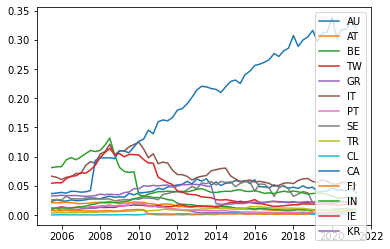

In [15]:
#Plot least important nodes of the network over time
cond = df_eig.iloc[0]<=0.1
df_eigB = df_eig[cond.index[cond]]
plt.plot(df_eigB)
plt.legend(df_eigB.columns)

In [8]:
#measure of community/hubs
#maximising modularity
from networkx.algorithms.community import greedy_modularity_communities
communities = greedy_modularity_communities(G, weight = 'value')
for i,c in enumerate(communities):
    print('Class '+str(i)+':', list(c))

Class 0: ['IE', 'BE', 'NL', 'GR', 'CA', 'PT', 'AT', 'AU', 'ES', 'TR', 'IT', 'GB', 'DE']
Class 1: ['CH', 'KR', 'TW', 'JP', 'CL', 'IN', 'FR', 'US']
Class 2: ['SE', 'FI']


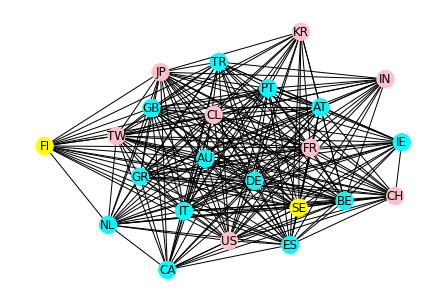

In [9]:
#display network with groups
node_groups = []
no_coms = 0
for i in communities:
    node_groups.append(list(i))
    no_coms += 1

colour_map = []
colour_list = ["cyan", "pink", "yellow", "green", "red", "blue", "pink"]
        
for node in G:
    for i in range(no_coms):
        if node in node_groups[i]:
            colour_map.append(colour_list[i])
            next

nx.draw(G, node_color=colour_map, with_labels=True)

In [29]:
#louvain maximising modularity
from cdlib import algorithms
communities = algorithms.louvain(G, weight = 'values', resolution = 1.05)
for i,c in enumerate(communities.communities):
    print('Class '+str(i)+':', list(c))

Class 0: ['AU', 'TW', 'FR', 'GR', 'NL', 'SE', 'TR', 'US', 'CH', 'FI', 'IE']
Class 1: ['AT', 'BE', 'DE', 'IT', 'ES', 'GB', 'CL', 'IN', 'KR']
Class 2: ['JP', 'PT', 'CA']


In [36]:
#calculate communities for all times
coms = lambda G: greedy_modularity_communities(G, weight = 'value')
coms_list = list(map(coms, g_list))

In [33]:
#calculate with louvain algorithm
coms_louvain = lambda G: algorithms.louvain(G, weight = 'value', resolution = 1)
coms_list = list(map(coms_louvain, g_list))
coms_list = list(map(lambda o: o.communities, coms_list))

2005-06-30


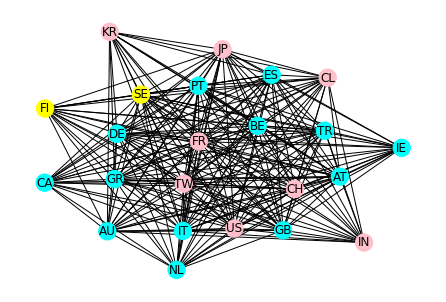

2005-09-30


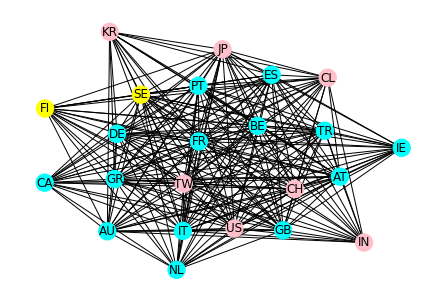

2005-12-31


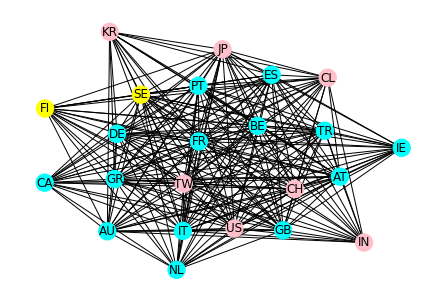

2006-03-31


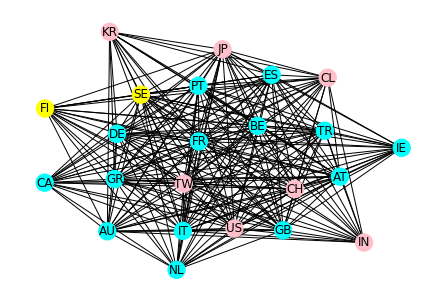

2006-06-30


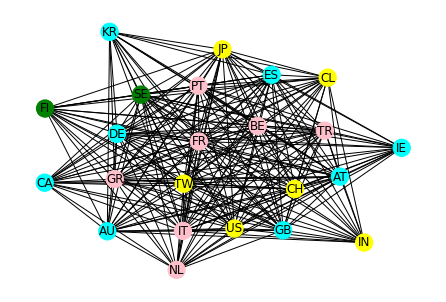

2006-09-30


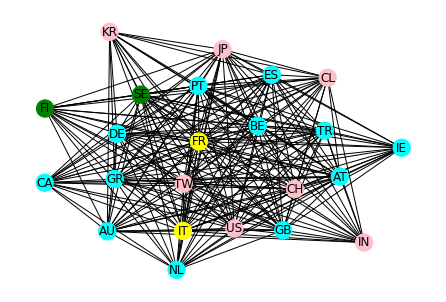

2006-12-31


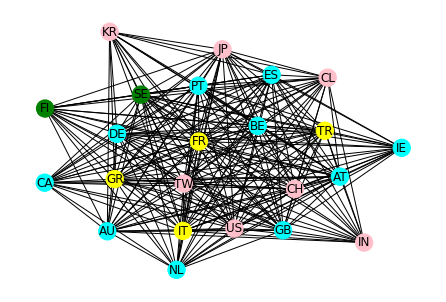

2007-03-31


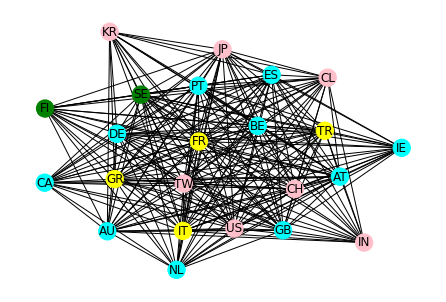

2007-06-30


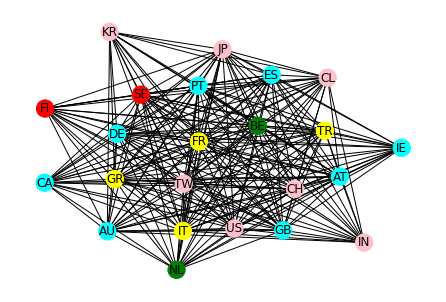

2007-09-30


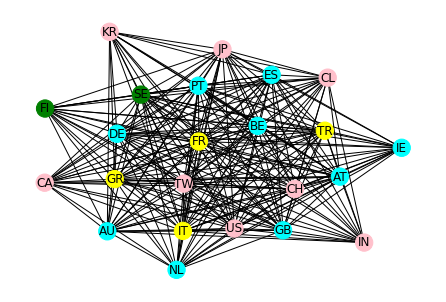

2007-12-31


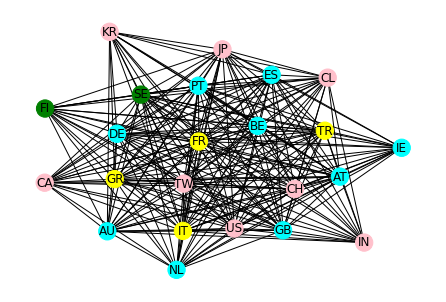

2008-03-31


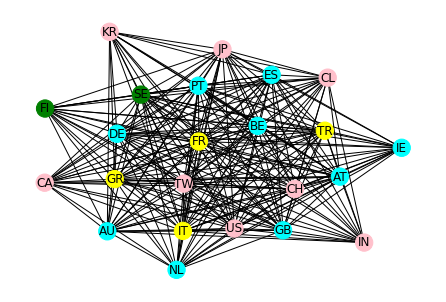

2008-06-30


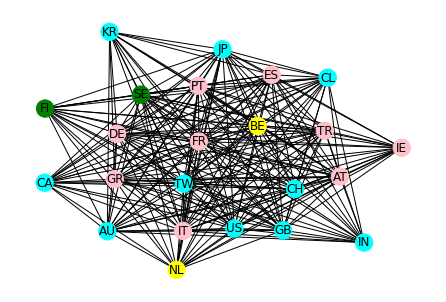

2008-09-30


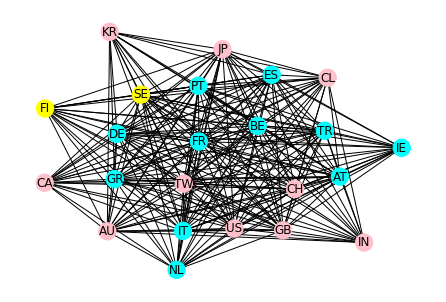

2008-12-31


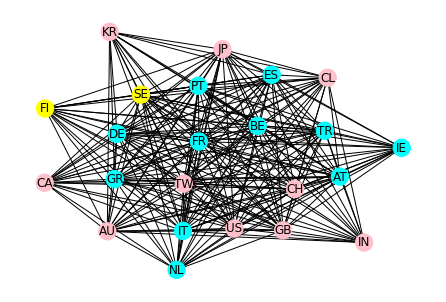

2009-03-31


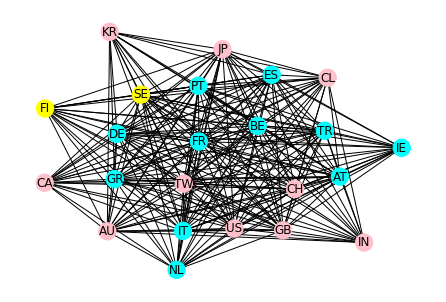

2009-06-30


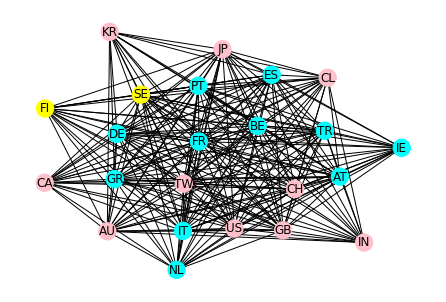

2009-09-30


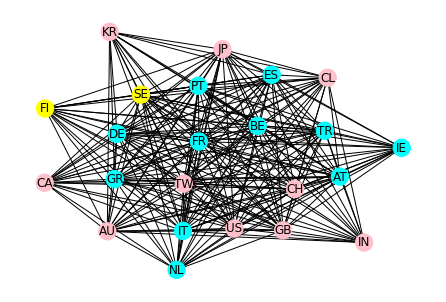

2009-12-31


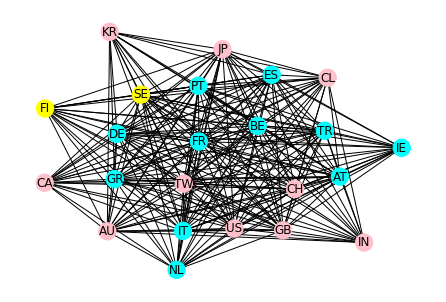

2010-03-31


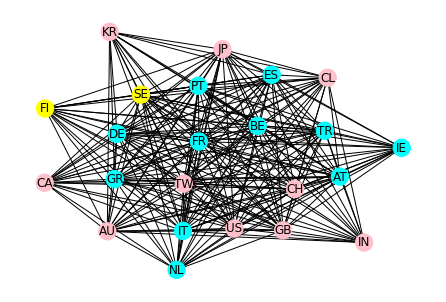

2010-06-30


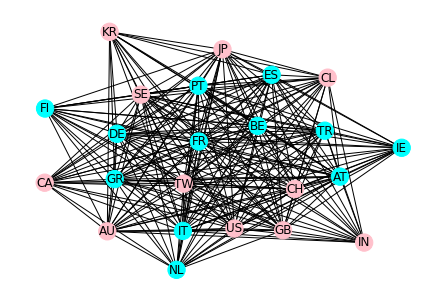

2010-09-30


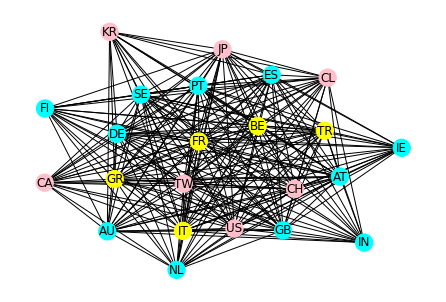

2010-12-31


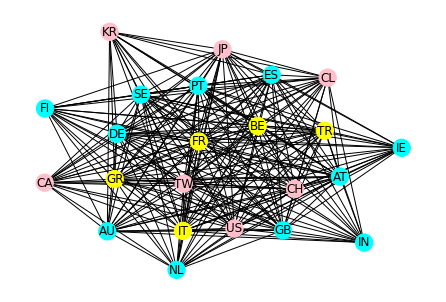

2011-03-31


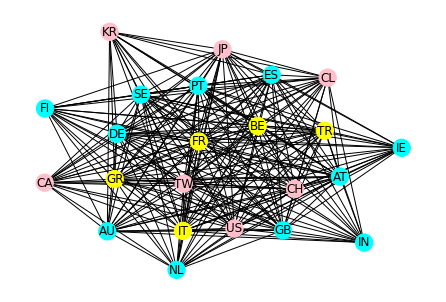

2011-06-30


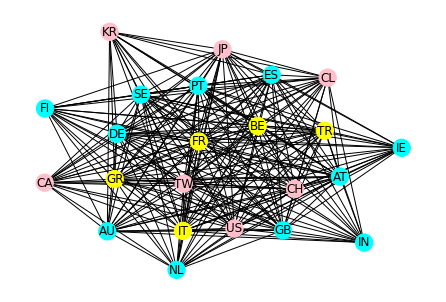

2011-09-30


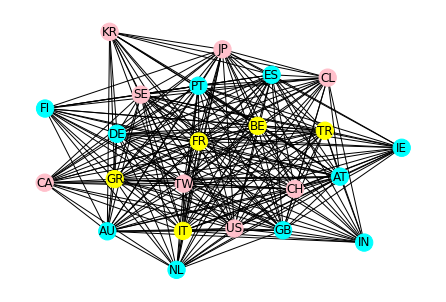

2011-12-31


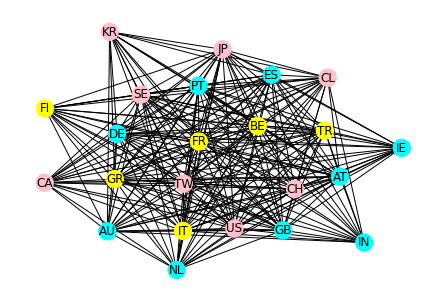

2012-03-31


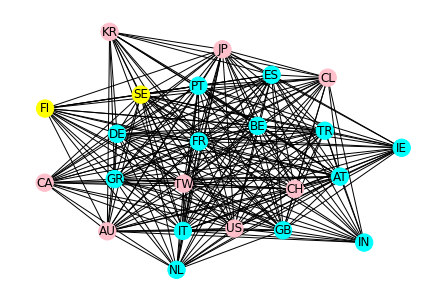

2012-06-30


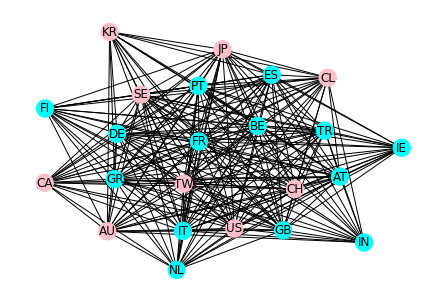

2012-09-30


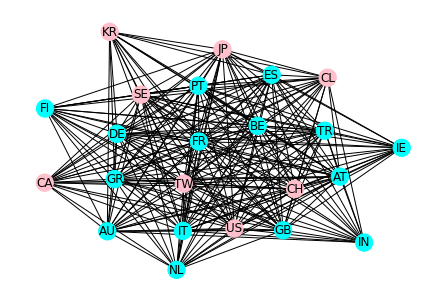

2012-12-31


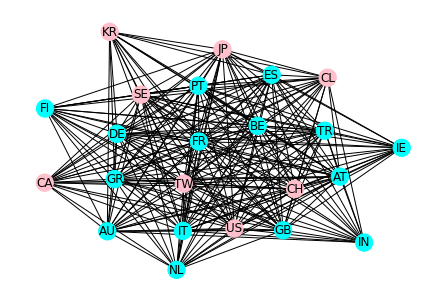

2013-03-31


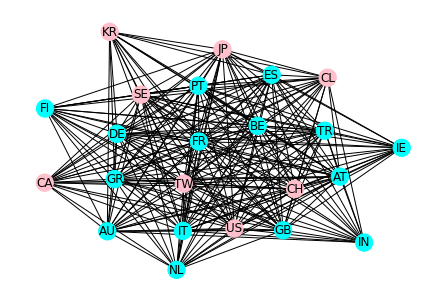

2013-06-30


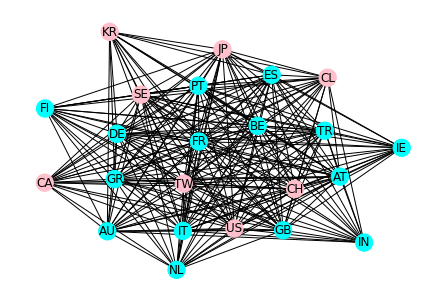

2013-09-30


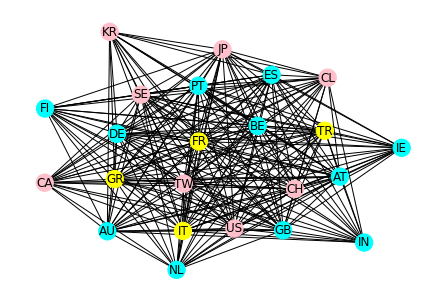

2013-12-31


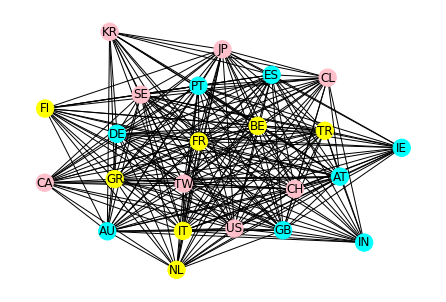

2014-03-31


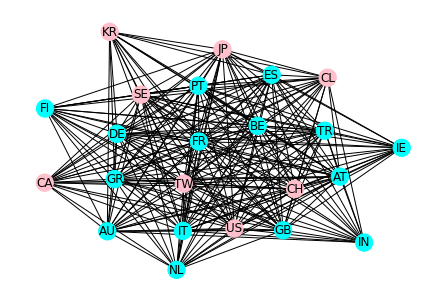

2014-06-30


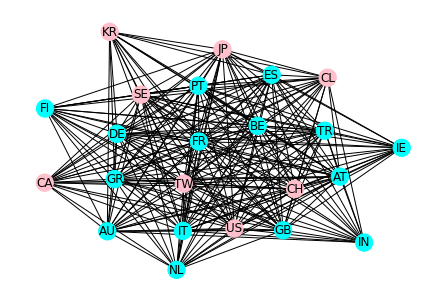

2014-09-30


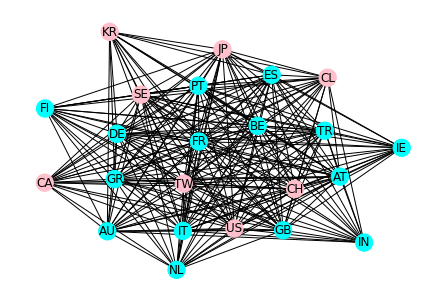

2014-12-31


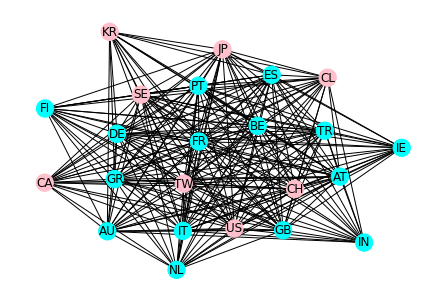

2015-03-31


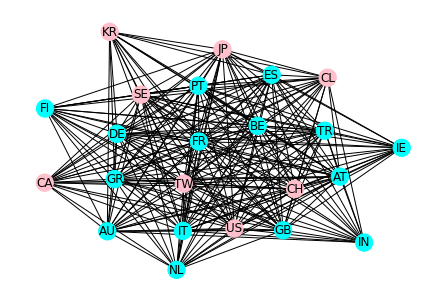

2015-06-30


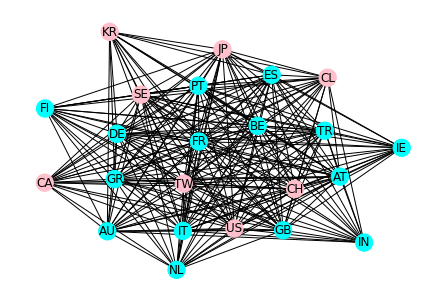

2015-09-30


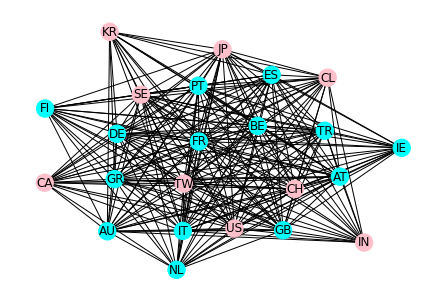

2015-12-31


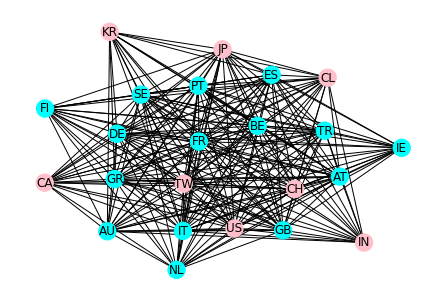

2016-03-31


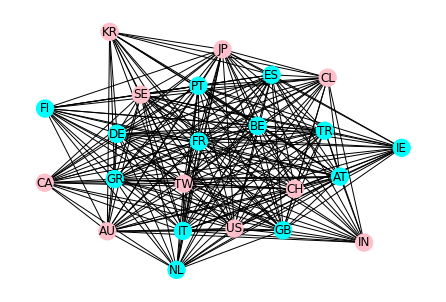

2016-06-30


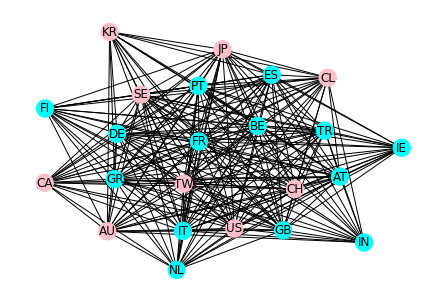

2016-09-30


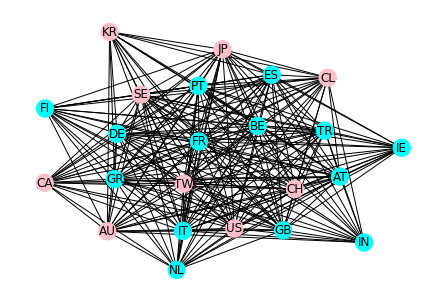

2016-12-31


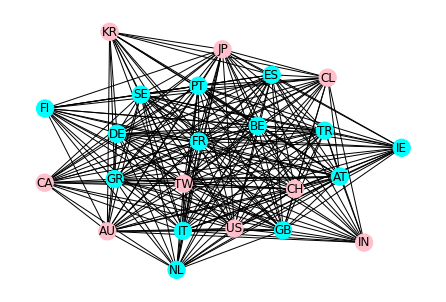

2017-03-31


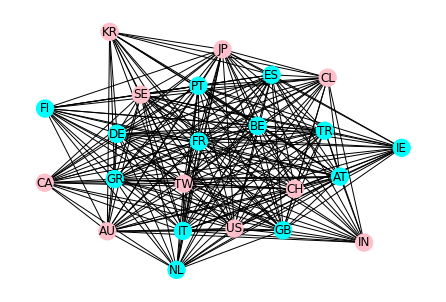

2017-06-30


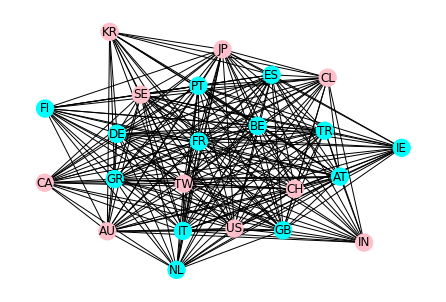

2017-09-30


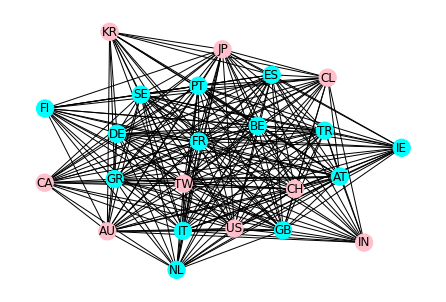

2017-12-31


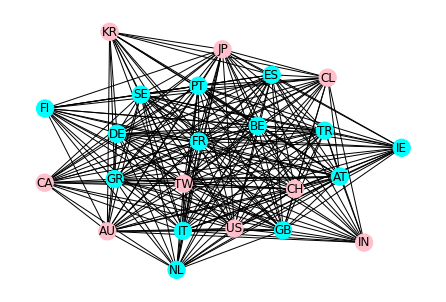

2018-03-31


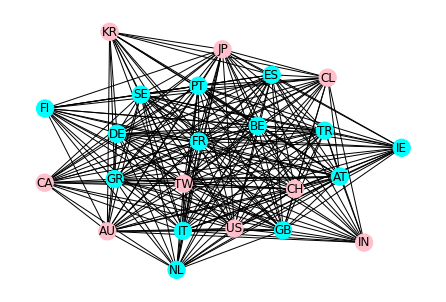

2018-06-30


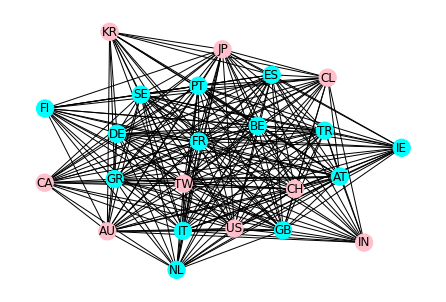

2018-09-30


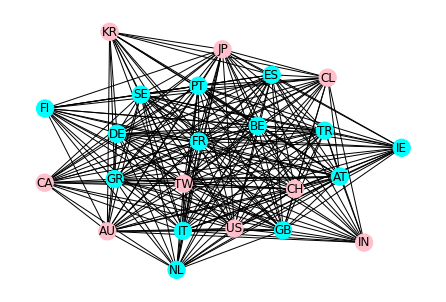

2018-12-31


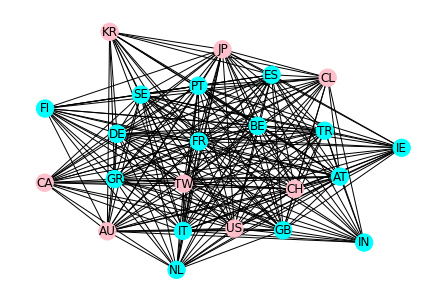

2019-03-31


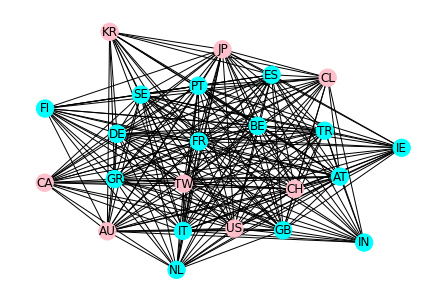

2019-06-30


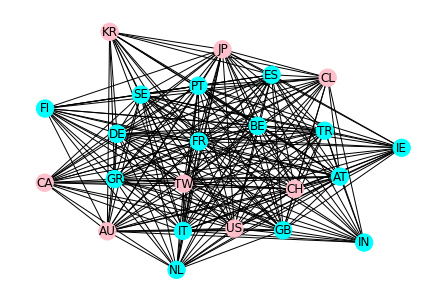

2019-09-30


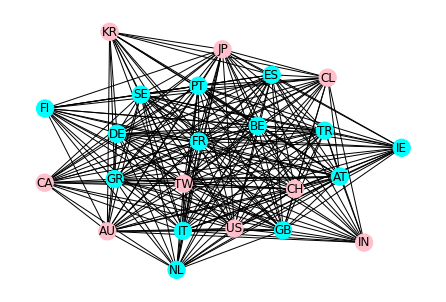

2019-12-31


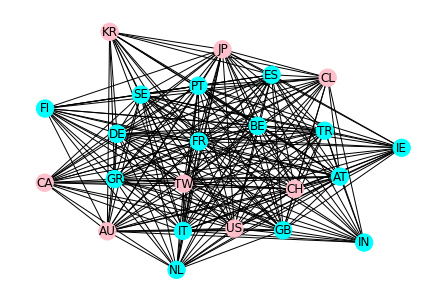

2020-03-31


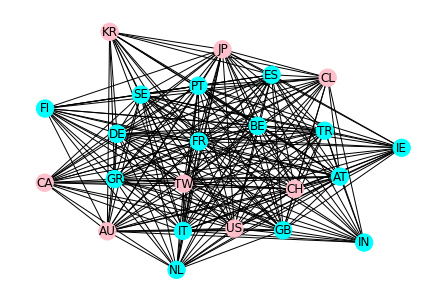

2020-06-30


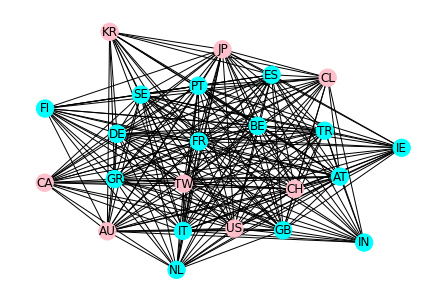

2020-09-30


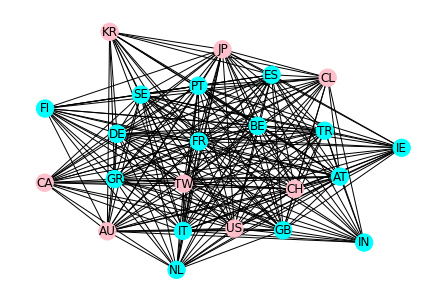

2020-12-31


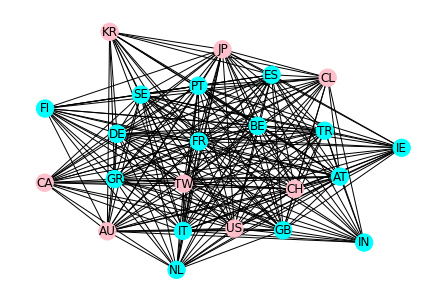

2021-03-31


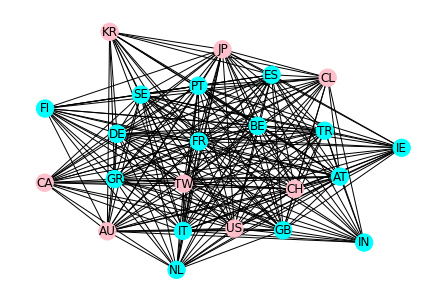

In [37]:
#Draw all network communities over time
pos = nx.spring_layout(G)
for i, communities in enumerate(coms_list):
    print(dates[i])
    node_groups = []
    no_coms = 0
    for i in communities:
        node_groups.append(list(i))
        no_coms += 1

    colour_map = []
    colour_list = ["cyan", "pink", "yellow", "green", "red", "blue", "pink"]

    for node in G:
        for i in range(no_coms):
            if node in node_groups[i]:
                colour_map.append(colour_list[i])
                next

    nx.draw(G, pos = pos, node_color = colour_map, with_labels = True)
    plt.draw()
    plt.show()

<AxesSubplot:>

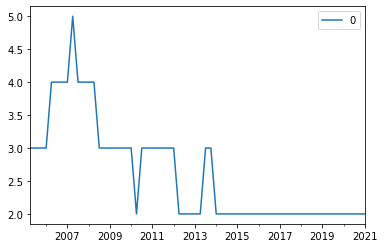

In [38]:
#number of communities over time
no_coms_list = list(map(len, coms_list))
df_coms = pd.DataFrame(no_coms_list)
df_coms.index = pd.to_datetime(dates)
df_coms.plot()